# PCA_EXCHANGE

# Model Construction

In [2]:
import numpy as np
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
from torchsummary import summary
import matplotlib.pyplot as plt

import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
import torch.nn.functional as F
from torchvision.utils import save_image
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
class Sublayer(nn.Module):
# sublayer contains convolutional layer to double the number of channel
# followed by btachnorm2d and ReLU as activation layers
    def __init__(self, input_channels):
        super(Sublayer, self).__init__()
        self.conv = nn.Conv2d(input_channels, input_channels*2, 4, 2, 1)
        self.batch= nn.BatchNorm2d(input_channels*2)
        self.relu =nn.ReLU(True)
    def forward(self, x):
        x = self.conv(x)
        x = self.batch(x)
        x = self.relu(x)
        return x
    def get_self(self):
        return self

class Encode(nn.Module):
#the encoder extracts the information of the input image
    def __init__(self):
        super(Encode, self).__init__()
        self.conv = nn.Conv2d(3, 16, 4, 2, 1)
        #by firstly using the convolutional layer to expand the channel size from 3 into 16
        self.batch= nn.BatchNorm2d(16)
        self.relu =nn.ReLU(True)
        #the size is then used to double the channel and halving the kernel image size for 6 times
        self.lay1=Sublayer(16)
        self.lay2=Sublayer(32)
        self.lay3=Sublayer(64)
        self.lay4=Sublayer(128)
        self.lay5=Sublayer(256)
        self.lay6=Sublayer(512)

        self.maxpool =nn.MaxPool2d((2,2))
        #last layer is Maxpool to find the maximum highlighted values 
        #self.lay7=Sublayer(1024)
    def forward(self,x):
        x = self.conv(x)
        x = self.batch(x)
        x = self.relu(x)
        x = self.lay1(x)
        x = self.lay2(x)
        x = self.lay3(x)
        x = self.lay4(x)
        x = self.lay5(x)
        x = self.lay6(x)
        x = self.maxpool(x)
        #x = self.lay7(x)
        return x

In [21]:
model=Encode()
summary(model,(3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]             784
       BatchNorm2d-2         [-1, 16, 128, 128]              32
              ReLU-3         [-1, 16, 128, 128]               0
            Conv2d-4           [-1, 32, 64, 64]           8,224
       BatchNorm2d-5           [-1, 32, 64, 64]              64
              ReLU-6           [-1, 32, 64, 64]               0
          Sublayer-7           [-1, 32, 64, 64]               0
            Conv2d-8           [-1, 64, 32, 32]          32,832
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             ReLU-10           [-1, 64, 32, 32]               0
         Sublayer-11           [-1, 64, 32, 32]               0
           Conv2d-12          [-1, 128, 16, 16]         131,200
      BatchNorm2d-13          [-1, 128, 16, 16]             256
             ReLU-14          [-1, 128,

* As can be seen, the encoder gives the final layer the size of 1024 to facilitate the representation of bottle neck layer for feature column vector

In [4]:
class DeSublayer(nn.Module):
    def __init__(self, input_channels):
        super(DeSublayer, self).__init__()
        self.tconv = nn.ConvTranspose2d(input_channels, int(input_channels/2), 4, 2, 1, bias = False)
        self.batch= nn.BatchNorm2d(int(input_channels/2))
        self.relu =nn.ReLU(True)
    def forward(self, x):
        x = self.tconv(x)
        x = self.batch(x)
        x = self.relu(x)
        return x
    def get_self(self):
        return self

class Decode(nn.Module):
    def __init__(self):
        super(Decode, self).__init__()
        self.tconv1 = nn.ConvTranspose2d(1024, 512, 4, 1, 0, bias = False)
        self.batch= nn.BatchNorm2d(512)
        self.relu =nn.ReLU(True)

        self.lay1=DeSublayer(512)
        self.lay2=DeSublayer(256)
        self.lay3=DeSublayer(128)
        self.lay4=DeSublayer(64)
        self.lay5=DeSublayer(32)
        #self.lay6=DeSublayer(16)

        self.tconv2=nn.ConvTranspose2d(16, 3, 4, 2, 1, bias = False)

        self.tanh =nn.Tanh()
        #self.lay7=Sublayer(1024)
    def forward(self,x):
        x = self.tconv1(x)
        x = self.batch(x)
        x = self.relu(x)
        x = self.lay1(x)
        x = self.lay2(x)
        x = self.lay3(x)
        x = self.lay4(x)
        x = self.lay5(x)
        #x = self.lay6(x)
        x = self.tconv2(x)
        x = self.tanh(x)
        #x = self.lay7(x)
        return x

In [35]:
decoder=Decode()
summary(decoder,(1024, 1, 1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 4, 4]       8,388,608
       BatchNorm2d-2            [-1, 512, 4, 4]           1,024
              ReLU-3            [-1, 512, 4, 4]               0
   ConvTranspose2d-4            [-1, 256, 8, 8]       2,097,152
       BatchNorm2d-5            [-1, 256, 8, 8]             512
              ReLU-6            [-1, 256, 8, 8]               0
        DeSublayer-7            [-1, 256, 8, 8]               0
   ConvTranspose2d-8          [-1, 128, 16, 16]         524,288
       BatchNorm2d-9          [-1, 128, 16, 16]             256
             ReLU-10          [-1, 128, 16, 16]               0
       DeSublayer-11          [-1, 128, 16, 16]               0
  ConvTranspose2d-12           [-1, 64, 32, 32]         131,072
      BatchNorm2d-13           [-1, 64, 32, 32]             128
             ReLU-14           [-1, 64,

* The decoder is constructed based on the reversed corresponding size of convolutional layers in encoder to return the feature vector in torch form (1024,1,1) back to the initial shape of the image.

# Data Loading & Preprocessing

In [5]:
Dir_AN='C:/Users/Pro/Desktop/Grp_Project/URGENT!/Jaff_W1/AN_train'
Dir_DI='C:/Users/Pro/Desktop/Grp_Project/URGENT!/Jaff_W1/DI_train'
Dir_FE='C:/Users/Pro/Desktop/Grp_Project/URGENT!/Jaff_W1/FE_train'
Dir_HA='C:/Users/Pro/Desktop/Grp_Project/URGENT!/Jaff_W1/HA_train'
Dir_NE='C:/Users/Pro/Desktop/Grp_Project/URGENT!/Jaff_W1/NE_train'
Dir_SA='C:/Users/Pro/Desktop/Grp_Project/URGENT!/Jaff_W1/SA_train'
Dir_SU='C:/Users/Pro/Desktop/Grp_Project/URGENT!/Jaff_W1/SU_train'
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
batch_size = 3 #take all 3 images of the selected woman for each epoch with the suffled rearrangement.
folder_AN = ImageFolder(Dir_AN, transform=tt.Compose([tt.ToTensor(),tt.Normalize(*stats)]))
folder_DI = ImageFolder(Dir_DI, transform=tt.Compose([tt.ToTensor(),tt.Normalize(*stats)]))
folder_FE = ImageFolder(Dir_FE, transform=tt.Compose([tt.ToTensor(),tt.Normalize(*stats)]))
folder_HA = ImageFolder(Dir_HA, transform=tt.Compose([tt.ToTensor(),tt.Normalize(*stats)]))
folder_NE = ImageFolder(Dir_NE, transform=tt.Compose([tt.ToTensor(),tt.Normalize(*stats)]))
folder_SA = ImageFolder(Dir_SA, transform=tt.Compose([tt.ToTensor(),tt.Normalize(*stats)]))
folder_SU = ImageFolder(Dir_SU, transform=tt.Compose([tt.ToTensor(),tt.Normalize(*stats)]))
train_AN = DataLoader(folder_AN, batch_size, shuffle=True, num_workers=3)#
train_DI = DataLoader(folder_DI, batch_size, shuffle=True, num_workers=3)
train_FE = DataLoader(folder_FE, batch_size, shuffle=True, num_workers=3)
train_HA = DataLoader(folder_HA, batch_size, shuffle=True, num_workers=3)#
train_NE = DataLoader(folder_NE, batch_size, shuffle=True, num_workers=3)
train_SA = DataLoader(folder_SA, batch_size, shuffle=True, num_workers=3)
train_SU = DataLoader(folder_SU, batch_size, shuffle=True, num_workers=3)

* Loading and preprocessing the data for each class distribution.

In [6]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]
def show_images(images, nmax=256):
    fig, ax = plt.subplots(figsize=(10, 50))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=256):
    for images, _ in dl:
        show_images(images, nmax)
        break

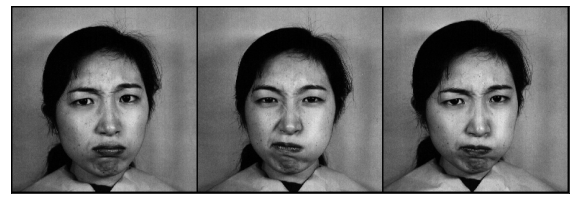

In [46]:
show_batch(train_AN)

* 3 images of 1 woman are chosen in each emotion category for the paired emotional transfer.

# Functions for Subprocesses of PCA

In [9]:
def iTensor(PCA_img):
#comverting PCA form of image back into tensor form before decoding
    ed_iT=np.expand_dims(PCA_img, axis=-1)#increase the tensor to fit with the input form
    ed_iT2=np.expand_dims(ed_iT, axis=-1)
    ed_iT2=np.double(ed_iT2)
    preDe=torch.tensor(ed_iT2)
    preDe=preDe.double()
    return preDe

In [7]:
def PCA_full(imgEN):
#processing the bottle neck encoded vector to rearrange 
#the parameters in the descending order of variance
    imgEN_arr=imgEN.cpu().detach().numpy()#convert tensor into numpy
    encodedImage=np.squeeze(imgEN_arr)
    X=encodedImage
    mean_vector=1/batch_size*np.sum([X[i,:] for i in range(X.shape[0])],axis=0)
    #mean vector calculated by the average vector among the input instance over the batchsize of 3
    cov=np.zeros((X.shape[1],X.shape[1]))
    #initializing the covariance matrix
    for i in range(X.shape[0]):#iterating through the features size of the ecoded vector
        covi=X[i]-np.asarray(mean_vector)
        #substracting each instance by the mean vector
        cov+=np.expand_dims(covi,axis=1)*covi
        # and accumulatively summing all of them to calculate the covariance matrix
    U, S, V = np.linalg.svd(cov)
    #injecting the covariance matrix into singular vector decomosition to rearrange the parameters
    # in a descending order
    new_X=np.matmul(X,U[:,0:1024])#retain all parameters with highest sorted variance
    return iTensor(new_X)#convert the image from array format into the tensor format for decoding 

In [8]:
def PCA(imgEN):
#PCA also process the instances and sort the features variance
# but this time it divides the PCA vectors into 2 sections containing 
# content components (first 256s) and emotional ones (last 768s) 
#outputing as head vector and tail vector respectively
#this division range is rooted from several times of testing with different range
    imgEN_arr=imgEN.cpu().detach().numpy()#convert tensor into numpy
    encodedImage=np.squeeze(imgEN_arr)
    X=encodedImage
    mean_vector=1/batch_size*np.sum([X[i,:] for i in range(X.shape[0])],axis=0)
    cov=np.zeros((X.shape[1],X.shape[1]))
    #covi=np.zeros((X.shape[0],X.shape[1]))
    for i in range(X.shape[0]):
        covi=X[i]-np.asarray(mean_vector)
        cov+=np.expand_dims(covi,axis=1)*covi
    U, S, V = np.linalg.svd(cov)
    tail_X=np.matmul(X,U[:,256:1024])#emotional segment separation
    head_X=np.matmul(X,U[:,0:256])#content segment separation
    return tail_X,head_X

In [10]:
def PCA_exchange(img1,img2):
#echange the emotional segments between 2 image domain
    X1,head1=PCA(img1)#extract the emotional and content parameters from the PCA
    X2,head2=PCA(img2)
    newX1=np.concatenate((head1, X2), axis=1)
    #concatenating the content part as head with the emotional segment of the other domain
    newX2=np.concatenate((head2, X1), axis=1)
    return iTensor(newX1),iTensor(newX2)#converting into tensor format to facilitate decoding

# Training Section

In [74]:
import torch.optim as optim
encoder=Encode()
decoder=Decode()
opt = optim.Adam(list(encoder.parameters())+list(decoder.parameters()), lr=2e-4,betas=(0.5,0.999))
#defining Mean Square Error Loss for each domain of emotion
mse1 = nn.MSELoss()
mse2 = nn.MSELoss()
mse3 = nn.MSELoss()
mse4 = nn.MSELoss()
mse5 = nn.MSELoss()
mse6 = nn.MSELoss()
mse7 = nn.MSELoss()
mse=[mse1,mse2,mse3,mse4,mse5,mse6,mse7]

In [81]:
import numpy as np
#total_step = len(train_All)
loss_list = []
acc_list = []
num_epochs = 150
#zipAll=

for epoch in range(num_epochs):
    for i, ((AN,l1),(DI,l2),(FE,l3),(HA,l4),(NE,l5),(SA,l6),(SU,l7)) in enumerate(zip(train_AN,train_DI,train_FE,train_HA,train_NE,train_SA,train_SU)):
        #load all the paired images from each class
        data=[AN,DI,FE,HA,NE,SA,SU]
        #storing it in a list for iteration later on
        loss=0#initializing the reconstruction loss
        for j in range(7):#iterating through the size of batch in each emotional domain
            enIMG=encoder(data[j])#decode the data from the corresponding class
            PCA_process=PCA_full(enIMG)
            #process the encoded image by the PCA with the full size but in the new descending order of variance
            deIMG=decoder(PCA_process)
            #so that the decoder can be trained to reconstruct the original image from the features in the PCA format
            loss+=mse[j](data[j].double(),deIMG)
            #the losses of all these emotional domains are accumualated to be optimized with decoder and encoder
        # Backprop and perform Adam optimisation
        opt.zero_grad()
        loss.backward()
        opt.step()

# Testing Section

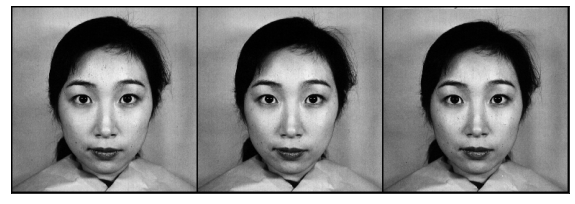

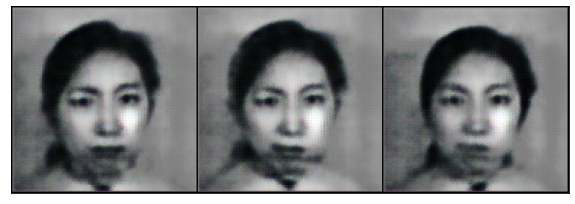

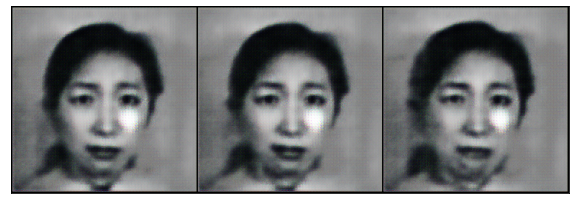

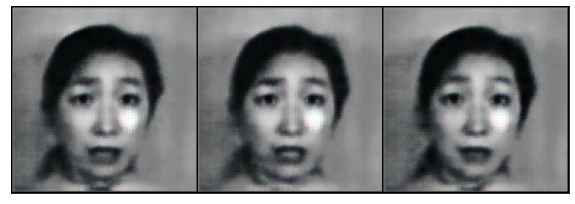

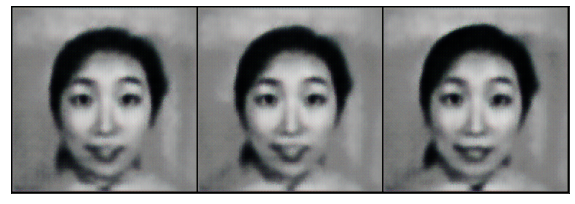

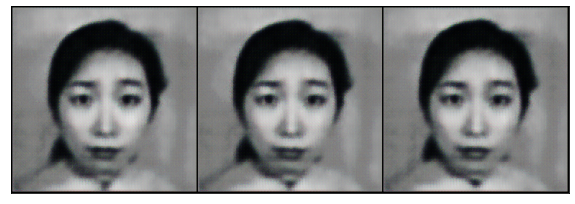

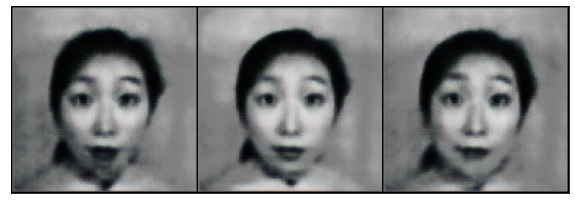

In [82]:
#the testing section for the trained encoder and decoder with the application
#of PCA_exchange to attach the target PCA component of target domain
for i, ((AN,l1),(DI,l2),(FE,l3),(HA,l4),(NE,l5),(SA,l6),(SU,l7)) in enumerate(zip(train_AN,train_DI,train_FE,train_HA,train_NE,train_SA,train_SU)):
    show_images(NE)#original domain
    enNE = encoder(NE)#encode it
    data=[AN,DI,FE,HA,SA,SU]#set of data for the desired domains
    for j in range(len(data)):
        enIMG=encoder(data[j])#also encode each of them
        exIMG,_ =PCA_exchange(enNE,enIMG)
        #change the emotional components of target domain into 
        #the emotional location of PCA vector of the bottle neck vector
        deIMG=decoder(exIMG)#encode them
        show_images(deIMG)# and we have the transferred images from Neutral domain into all other domains.

In [13]:
#finding the emotional segment to form the naviatating matrix for the generic case
for i, ((AN,l1),(DI,l2),(FE,l3),(HA,l4),(NE,l5),(SA,l6),(SU,l7)) in enumerate(zip(train_AN,train_DI,train_FE,train_HA,train_NE,train_SA,train_SU)):
    data=[AN,DI,FE,HA,NE,SA,SU]
    transM=[]
    for j in range(len(data)):
        with torch.no_grad():
            emo,main=PCA(encoder(data[j]))
        #print(emo.shape)
        transM.append(np.expand_dims(emo[1],axis=0))
    M = np.concatenate((transM[0],transM[1],transM[2],transM[3],transM[4],transM[5],transM[6]), axis=0)
print(M.shape,M) 

(7, 768) [[-1.85749819 -0.13167308 -0.42685192 ... -0.99514551  0.37671409
  -2.66658004]
 [-1.10595096 -1.58613861  0.21559296 ... -0.20037996  0.13513229
  -1.39723761]
 [ 1.63174849 -2.20085731  0.79712662 ... -1.13643113 -0.12265119
   0.22380137]
 ...
 [-2.07619187 -0.83579543  0.8215297  ... -2.53890871  0.28291467
   0.33527278]
 [ 0.27505227 -2.48628931 -0.74570526 ...  1.69626495  0.22335115
   0.34604087]
 [-0.49123332  0.84610911 -0.26874706 ...  1.0555767   1.53991819
   0.14926444]]


# Correlation Analysis of Emotional Segments

In [14]:
corrM=np.corrcoef(M)

In [15]:
import plotly.express as px
corrM=np.corrcoef(M)
#correlation matrix of all expression via the emotional segment of PCA
fig = px.imshow(corrM,x=['AN','DI','FE','HA','NE','SA','SU'],
                y=['AN','DI','FE','HA','NE','SA','SU'])
fig.show()

# Other Tests of the Trained models

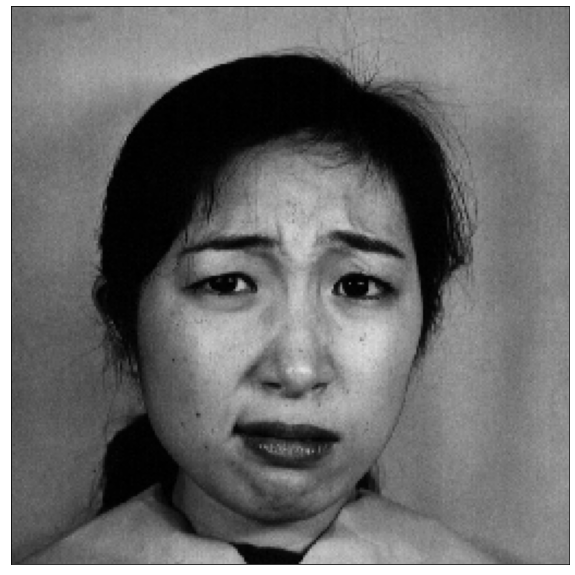

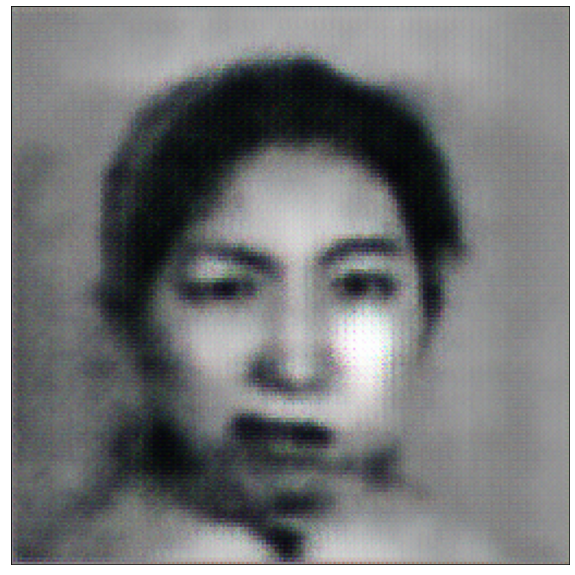

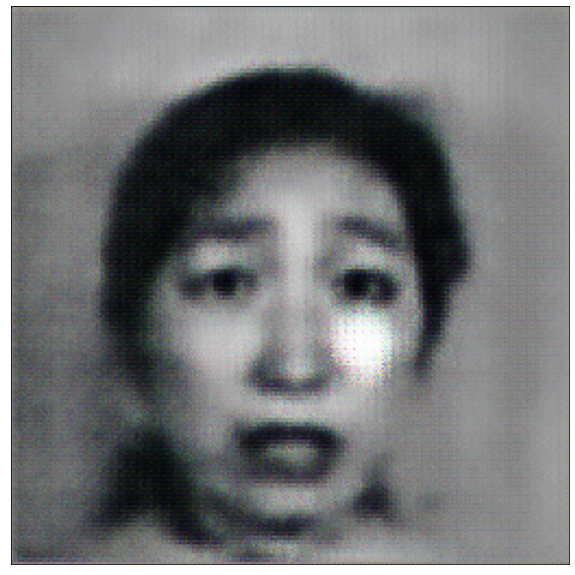

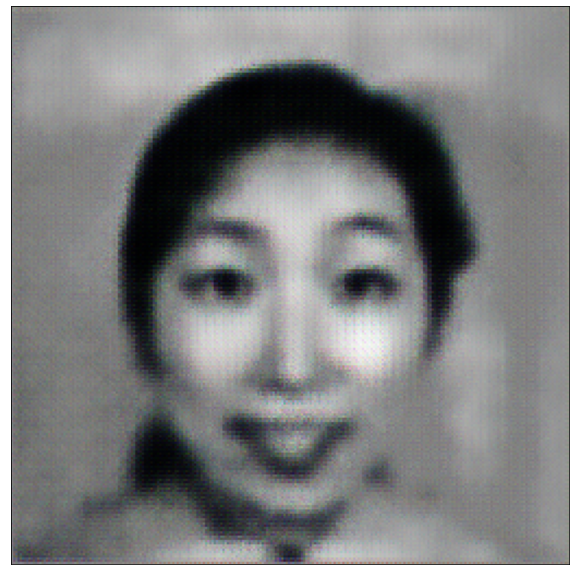

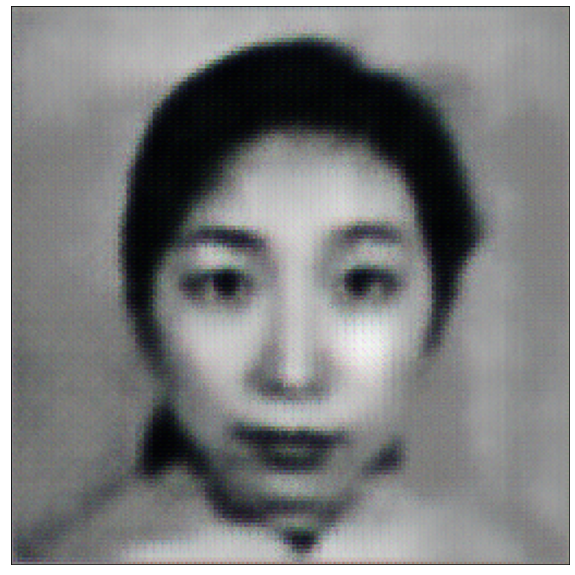

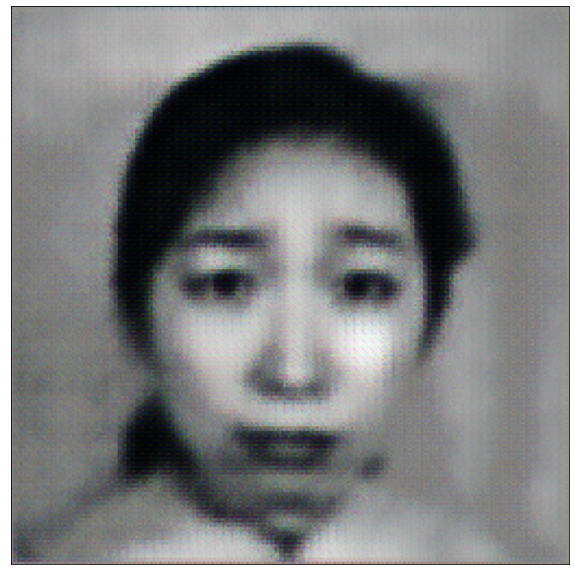

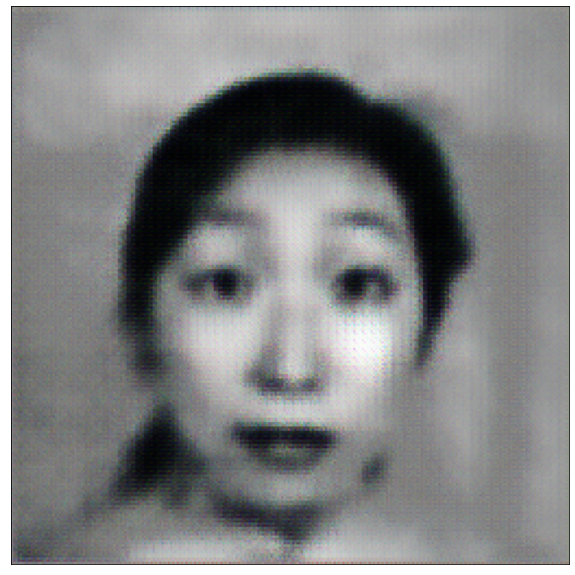

In [189]:
#another test of emotional transfer from Distress to other remaining domains
for i, ((AN,l1),(DI,l2),(FE,l3),(HA,l4),(NE,l5),(SA,l6),(SU,l7)) in enumerate(zip(train_AN,train_DI,train_FE,train_HA,train_NE,train_SA,train_SU)):
    #opt.zero_grad()
    show_images(DI[0])
    enDI = encoder(DI)
    data=[AN,FE,HA,NE,SA,SU]
    for j in range(len(data)):
        enIMG=encoder(data[j])
        exIMG,_ =PCA_exchange(enDI,enIMG)
        deIMG=decoder(exIMG)
        show_images(deIMG[0])
        
    #show_images(torch.cat(NE[0],deIMG[0],deIMG[1],deIMG[2],deIMG[3],deIMG[4],deIMG[5]))

In [12]:
en=torch.load('encoderAll.pt')
de=torch.load('decoderAll.pt')#save the parameters of encoder and decoder

In [83]:
torch.save(encoder,'encoderAllvar.pt')
torch.save(decoder,'decoderAllvar.pt')

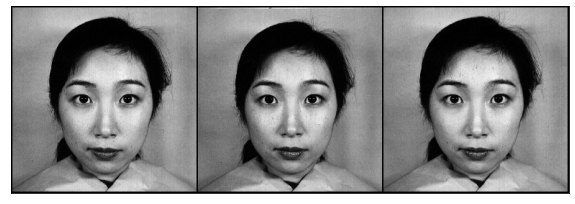

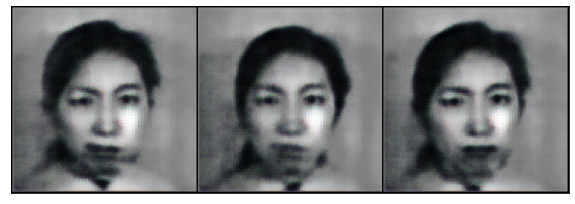

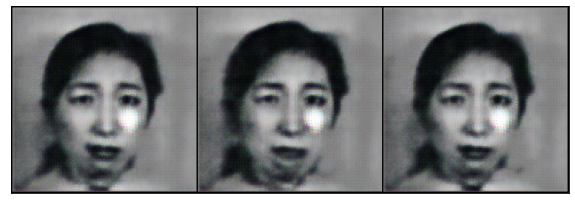

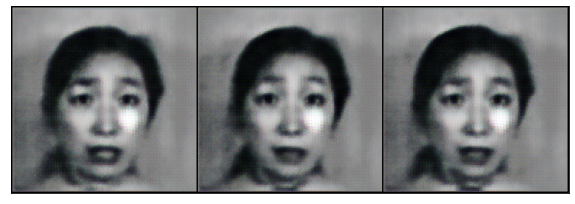

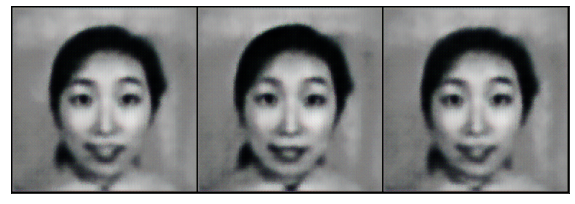

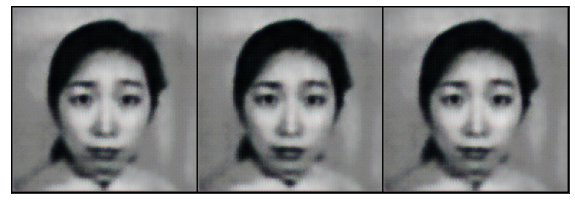

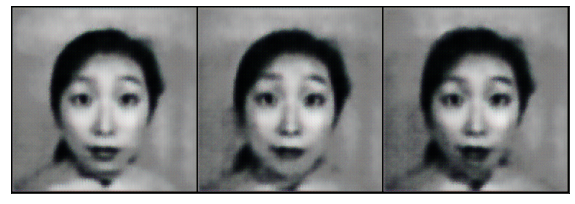

In [190]:
#from neutral to others
for i, ((AN,l1),(DI,l2),(FE,l3),(HA,l4),(NE,l5),(SA,l6),(SU,l7)) in enumerate(zip(train_AN,train_DI,train_FE,train_HA,train_NE,train_SA,train_SU)):
    #opt.zero_grad()
    show_images(NE)
    enNE = encoder(NE)
    data=[AN,DI,FE,HA,SA,SU]
    for j in range(len(data)):
        enIMG=encoder(data[j])
        exIMG,_ =PCA_exchange(enNE,enIMG)
        deIMG=decoder(exIMG)
        show_images(deIMG)

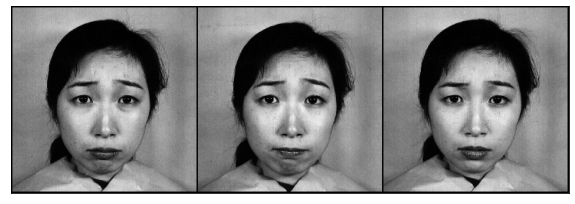

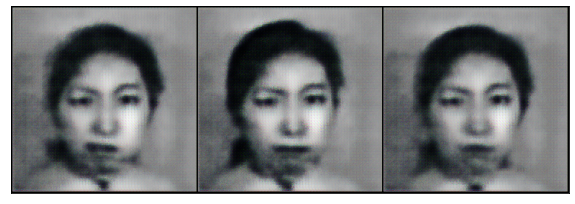

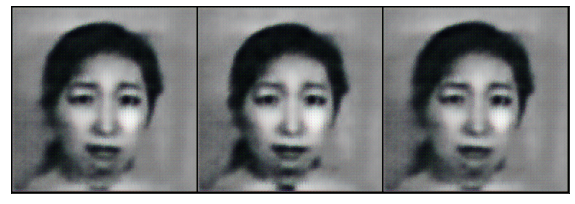

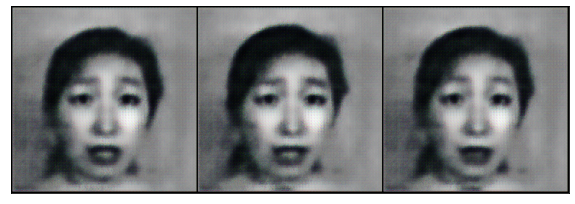

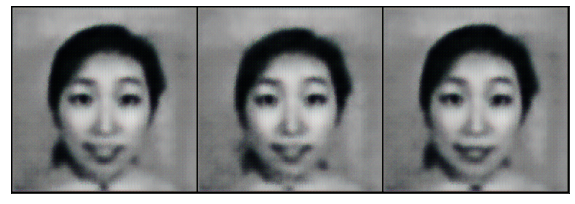

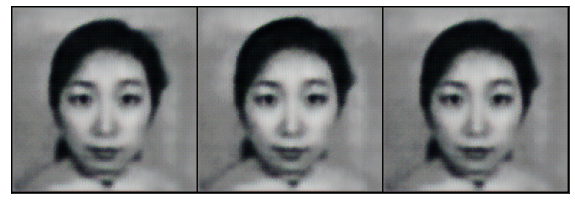

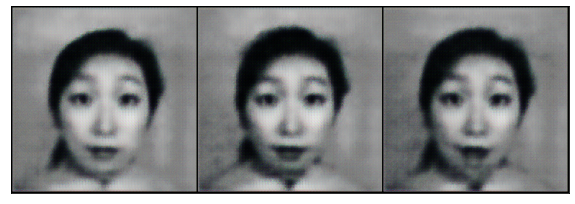

In [191]:
#from Sad to others
for i, ((AN,l1),(DI,l2),(FE,l3),(HA,l4),(NE,l5),(SA,l6),(SU,l7)) in enumerate(zip(train_AN,train_DI,train_FE,train_HA,train_NE,train_SA,train_SU)):
    #opt.zero_grad()
    show_images(SA)
    enSA = en(SA)
    data=[AN,DI,FE,HA,NE,SU]
    for j in range(len(data)):
        enIMG=en(data[j])
        exIMG,_ =PCA_exchange(enSA,enIMG)
        deIMG=de(exIMG)
        show_images(deIMG)

In [166]:
for i, ((AN,l1),(DI,l2),(FE,l3),(HA,l4),(NE,l5),(SA,l6),(SU,l7)) in enumerate(zip(train_AN,train_DI,train_FE,train_HA,train_NE,train_SA,train_SU)):
    data=[AN,DI,FE,HA,NE,SA,SU]
    transM=[]
    for j in range(len(data)):
        with torch.no_grad():
            emo,main=PCA(en(data[j]))
        #print(emo.shape)
        transM.append(np.expand_dims(emo[1],axis=0))
    Mb = np.concatenate((transM[0],transM[1],transM[2],transM[3],transM[4],transM[5],transM[6]), axis=0)
print(Mb.shape,Mb)    

(7, 768) [[-0.32192113 -0.22923971  2.06169932 ... -0.91694156  0.17981759
   0.20532585]
 [-1.10595096 -1.58613861  0.21559296 ... -0.20037996  0.13513229
  -1.39723761]
 [-2.80034508 -0.34113276  0.00517465 ...  0.09181702 -1.48509078
  -0.4900395 ]
 ...
 [ 1.40096841  0.26897833  1.70212721 ... -1.34376249 -0.59101926
  -2.91969115]
 [-1.10306445 -1.04062853  0.24463457 ...  0.47890514  1.26528183
   1.23937236]
 [-0.49123332  0.84610911 -0.26874706 ...  1.0555767   1.53991819
   0.14926444]]


# Final Form of PCA exchange with 3 segments Separation

In [186]:
def PCA3(imgEN):
# in fact, the emotional information is observed to be stored in 
#segments located from 256 to 896 of the PCA feature vector (62.5% in total parameters) 
    imgEN_arr=imgEN.cpu().detach().numpy()#convert tensor into numpy
    encodedImage=np.squeeze(imgEN_arr)
    X=encodedImage
    mean_vector=1/batch_size*np.sum([X[i,:] for i in range(X.shape[0])],axis=0)
    cov=np.zeros((X.shape[1],X.shape[1]))
    #covi=np.zeros((X.shape[0],X.shape[1]))
    for i in range(X.shape[0]):
        covi=X[i]-np.asarray(mean_vector)
        cov+=np.expand_dims(covi,axis=1)*covi
    U, S, V = np.linalg.svd(cov)
    tail_X=np.matmul(X,U[:,896:1024])# the tail components (128)
    mid_X=np.matmul(X,U[:,256:896])#the emotional components (640)
    head_X=np.matmul(X,U[:,0:256])#the head components (256) for hair and face shape
    return head_X,mid_X,tail_X
def PCA3_exchange(img1,img2):
    #exchange the emotional components of 2 images
    head1,emo1,tail1=PCA3(img1)
    head2,emo2,tail2=PCA3(img2)
    newX1=np.concatenate((head1, emo2,tail1), axis=1)
    newX2=np.concatenate((head2, emo1,tail2), axis=1)
    return iTensor(newX1),iTensor(newX2)

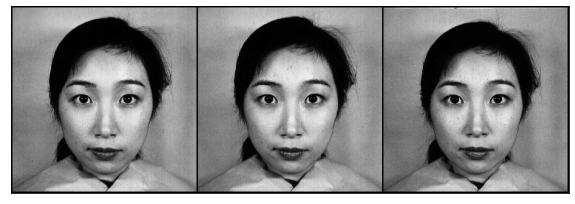

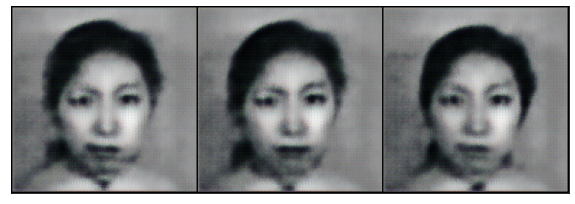

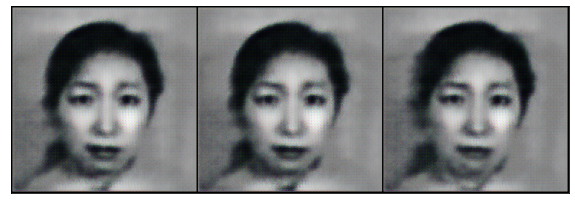

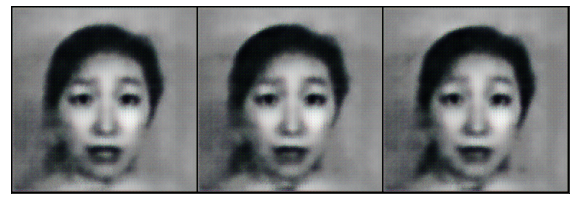

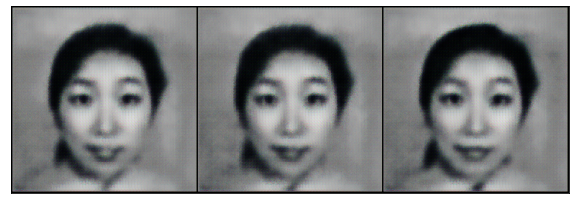

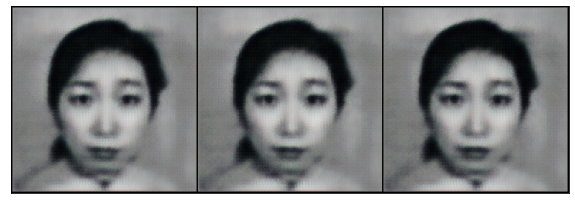

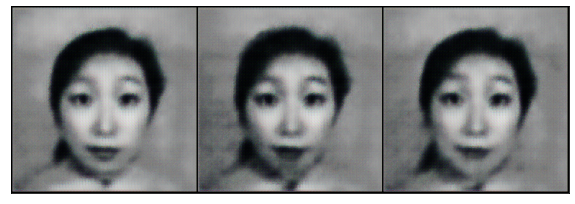

In [188]:
#a test for the 3-segment division of PCA feature vector 
#to transfer from Neutral into others
for i, ((AN,l1),(DI,l2),(FE,l3),(HA,l4),(NE,l5),(SA,l6),(SU,l7)) in enumerate(zip(train_AN,train_DI,train_FE,train_HA,train_NE,train_SA,train_SU)):
    #opt.zero_grad()
    show_images(NE)
    enNE = en(NE)
    data=[AN,DI,FE,HA,SA,SU]
    for j in range(len(data)):
        enIMG=en(data[j])
        exIMG,_ =PCA3_exchange(enNE,enIMG)
        deIMG=de(exIMG)
        show_images(deIMG)

In [167]:
import plotly.express as px
corrMb=np.corrcoef(Mb)
fig = px.imshow(corrM,x=['AN','DI','FE','HA','NE','SA','SU'],
                y=['AN','DI','FE','HA','NE','SA','SU'])
fig.show()

# IMPLEMENTATION OF STAR_GAN

In [2]:
import numpy as np
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
from torchsummary import summary
import matplotlib.pyplot as plt

import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
import torch.nn.functional as F
from torchvision.utils import save_image
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

# Model Construction

In [2]:
class ResidualLayer(nn.Module):
#constructing the residual block layers for generator
#giving the same input and output size of channels
    def __init__(self, in_channels, out_channels):
        super(ResidualLayer, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.InstanceNorm2d(out_channels, affine=True, track_running_stats=True),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.InstanceNorm2d(out_channels, affine=True, track_running_stats=True))
    def forward(self, x):
        return x + self.main(x)

In [3]:
class Discriminator(nn.Module):
#structure of discriminator for StarGAN
    def __init__(self, image_size=256, e_dim=7, repeat_num=6):
        super(Discriminator, self).__init__()
        #first layers expand the channel numbers from 3 into 64
        #followed by a leakyReLU as activation 
        layers = []
        layers.append(nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1))
        layers.append(nn.LeakyReLU(0.01))

        curr_dim = 64 #so we have 64 as the current dimention
        for i in range(1, repeat_num):
        #keep expanding the channel size 6 times
        #each iteration doubles the number of channel
        #they are also followed by LeakyReLU layers
            layers.append(nn.Conv2d(curr_dim, curr_dim*2, kernel_size=4, stride=2, padding=1))
            layers.append(nn.LeakyReLU(0.01))
            curr_dim = curr_dim * 2

        kernel_out = int(image_size / np.power(2, repeat_num))
        #defining the output image size based on the 2 polinominal of repeat_number  
        self.main = nn.Sequential(*layers)
        #gathering all these layer sequentially as the main component of discriminator
        self.conv1 = nn.Conv2d(curr_dim, 1, kernel_size=3, stride=1, padding=1, bias=False)
        #the discriminator gives 2 outputs
        #first one is for source discrimination for real/fake image
        # so the number of dimention is narrowed down to 1
        self.conv2 = nn.Conv2d(curr_dim, e_dim, kernel_size=kernel_out, bias=False)
        #the second output give the probability the disciminated image
        # is in which domain considering the number of emotional dimention e_dim
    def forward(self, x):
        h = self.main(x)#processingLayers
        out_src = self.conv1(h)# a probability distribution over the source given by D()
        out_cls = self.conv2(h)#domain classification
        return out_src, out_cls.view(out_cls.size(0), out_cls.size(1))

In [4]:
summary(Discriminator(),(3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           3,136
         LeakyReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3          [-1, 128, 64, 64]         131,200
         LeakyReLU-4          [-1, 128, 64, 64]               0
            Conv2d-5          [-1, 256, 32, 32]         524,544
         LeakyReLU-6          [-1, 256, 32, 32]               0
            Conv2d-7          [-1, 512, 16, 16]       2,097,664
         LeakyReLU-8          [-1, 512, 16, 16]               0
            Conv2d-9           [-1, 1024, 8, 8]       8,389,632
        LeakyReLU-10           [-1, 1024, 8, 8]               0
           Conv2d-11           [-1, 2048, 4, 4]      33,556,480
        LeakyReLU-12           [-1, 2048, 4, 4]               0
           Conv2d-13              [-1, 1, 4, 4]          18,432
           Conv2d-14              [-1, 

In [3]:
class Generator(nn.Module):
#generator stucture
    def __init__(self, e_dim=7, repeat_num=6):
        super(Generator, self).__init__()
        layers = []
        #similar to discriminator, initial image channel is expanded
        # into 64
        #however, the emotional layer is embedded along the channel dimention 
        # to direct the original image into the target domain
        layers.append(nn.Conv2d(3+e_dim, 64, kernel_size=7, stride=1, padding=3, bias=False))
        layers.append(nn.InstanceNorm2d(64, affine=True, track_running_stats=True))
        layers.append(nn.ReLU(inplace=True))
        curr_dim = 64#current dimention before downsampling
        for i in range(2):
            #decomposing the initial dimention of channel by a half for 2 times
            layers.append(nn.Conv2d(curr_dim, curr_dim*2, kernel_size=4, stride=2, padding=1, bias=False))
            layers.append(nn.InstanceNorm2d(curr_dim*2, affine=True, track_running_stats=True))
            layers.append(nn.ReLU(inplace=True))
            curr_dim = curr_dim * 2
        # Residual layers.
        for i in range(repeat_num):#applying the residual layers 
            layers.append(ResidualLayer(in_channels=curr_dim, out_channels=curr_dim))
        for i in range(2):
            # Up-sampling the layers with corresponding reversed convolution with the downsampling layers
            layers.append(nn.ConvTranspose2d(curr_dim, curr_dim//2, kernel_size=4, stride=2, padding=1, bias=False))
            layers.append(nn.InstanceNorm2d(curr_dim//2, affine=True, track_running_stats=True))
            layers.append(nn.ReLU(inplace=True))
            curr_dim = curr_dim // 2
        layers.append(nn.Conv2d(curr_dim, 3, kernel_size=7, stride=1, padding=3, bias=False))
        #return the original channel shape
        layers.append(nn.Tanh())
        self.main = nn.Sequential(*layers)
    def forward(self, x, c):#attached with a target label domain
        #embedding = self.embed(c).view(c.shape[0],1,256,256)
        c = c.view(c.size(0), c.size(1), 1, 1)
        #1*7*1*1 process the labels to make it matches with the tensor view of images 
        c = c.repeat(1, 1, x.size(2), x.size(3))
        # before concatenating the target label into
        x = torch.cat([x, c], dim=1)
        return self.main(x) 
    # the label is embedded before putting into main components of sequential layers 

# Data Loading

In [5]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')  
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device    
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)
    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [6]:
device = get_default_device()#load the available device

In [7]:
image_size = 256
batch_size = 16 #number of image for each trainning
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5) #normalization into mean
DIR_All='C:/Users/Pro/Desktop/Grp_Project/URGENT!/JAFFE_LABEL'
#load the images from the folder file and preprocess it into the tensor form and normalization into mean value
folder_All = ImageFolder(DIR_All, transform=tt.Compose([tt.RandomHorizontalFlip(),tt.ToTensor(),tt.Normalize(*stats)]))
train_All = DataLoader(folder_All, batch_size, shuffle=True, num_workers=1)
#7 emotional domains are stored in 7 different folders representing their corresponding labels 
#(from 0 to 6 )

In [8]:
def denorm(img_tensors):
    #reverse normalization
    return img_tensors * stats[1][0] + stats[0][0]
def show_images(images, nmax=256):
    #and show the package of images in the intial form
    fig, ax = plt.subplots(figsize=(10, 50))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=256):
    for images, _ in dl:
        show_images(images, nmax)
        break

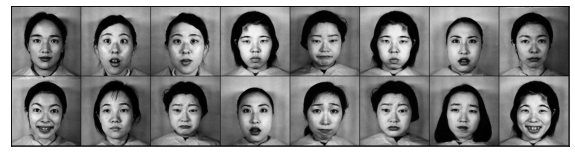

In [9]:
show_batch(train_All)

In [10]:
D = to_device(Discriminator(), device)
# inject the discriminator and generator into the device
G = to_device(Generator(), device)

In [11]:
data_loader = DeviceDataLoader(train_All,device)
#inject the data also into the device

In [12]:
import torch.optim as optim
#defining the optimization method for Discriminator and Generator
opt_disc = optim.Adam(D.parameters(), lr=1e-4,betas=(0.5,0.999))#momentum & beta2
opt_gen = optim.Adam(G.parameters(), lr=1e-4,betas=(0.5,0.999))

In [13]:
cls_loss=nn.CrossEntropyLoss()#loss for label optimization
L1_loss = nn.L1Loss()#reconstruction loss

# Materials

In [14]:
def label2onehot(labels, dim):
    #convert the initial labels from defined by different folder into one-hot vector
    #containing only 1s for the target domain and match with the size of the batch
    batch_size = labels.size(0)
    out = torch.zeros(batch_size, dim)
    out[np.arange(batch_size), labels.long()] = 1
    return out

In [21]:
label2onehot(torch.ones(3)*2, 7)

tensor([[0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0.]])

In [15]:
def gradient_penalty(y, x):
    """Compute gradient penalty: (L2_norm(dy/dx) - 1)**2."""
    weight = torch.ones(y.size()).to(device)
    dydx = torch.autograd.grad(outputs=y,inputs=x,grad_outputs=weight,retain_graph=True,create_graph=True,only_inputs=True)[0]
    dydx = dydx.view(dydx.size(0), -1)
    dydx_l2norm = torch.sqrt(torch.sum(dydx**2, dim=1))
    return torch.mean((dydx_l2norm-1)**2)

# Training

In [38]:
loss = {}

In [57]:
num_epochs = 10
for epoch in range(num_epochs):
    for i, (x_real, label_org) in enumerate(data_loader):
        rand_idx = torch.randperm(label_org.size(0))
        #randomly create target label corresponding to the number of batch size
        label_trg = label_org[rand_idx]
        
        c_org = label2onehot(label_org, 7)
        #convert the raw labels of original and target side
        #into one hot vector
        c_trg = label2onehot(label_trg, 7)
        #inject these parameters into device
        x_real = x_real.to(device)           # Input images.
        c_org = c_org.to(device)             # Original domain labels.
        c_trg = c_trg.to(device)             # Target domain labels.
        label_org = label_org.to(device)     # Labels for computing classification loss.
        label_trg = label_trg.to(device)     # Labels for computing classification loss.
        ##TrainDiscriminator:
        #loss with real images
        out_src, out_cls = D(x_real)
        #putting the real images into Discriminator
        d_loss_real = - torch.mean(out_src)
        #defining the mean as the probability for the reality of the input image
        d_loss_cls = cls_loss(out_cls, label_org)
        #in parallel, the correct label is 
        #ensured and optimized by the classificationloss
        # with the later output of D and the original label

        # Compute loss with fake images.
        x_fake = G(x_real, c_trg)
        #injecting the fake images into the discriminator to train it 
        #the ability to distinguish fake images and fake target labels
        out_src, out_cls = D(x_fake)
        d_loss_fake = torch.mean(out_src)

        # Compute loss for gradient penalty.
        alpha = torch.rand(x_real.size(0), 1, 1, 1).to(device)
        x_hat = (alpha * x_real.data + (1 - alpha) * x_fake.data).requires_grad_(True)
        out_src, _ = D(x_hat)
        d_loss_gp = gradient_penalty(out_src, x_hat)

        # Backward and optimize.
        d_loss = d_loss_real + d_loss_fake + d_loss_cls + 10 * d_loss_gp
        #sum up all loss and use Adam optimizor to backpropagate for updating weight
        opt_disc.zero_grad()
        d_loss.backward()
        opt_disc.step()
        #save the loss data
        loss['D/loss_real'] = d_loss_real.item()
        loss['D/loss_fake'] = d_loss_fake.item()
        loss['D/loss_cls'] = d_loss_cls.item()
        #loss['D/loss_gp'] = d_loss_gp.item()
        
        if (i+1) % 5 == 0:
            #generator is trained for each 5 times of the discriminator
            # Original-to-target domain.
            x_fake = G(x_real, c_trg)
            #generate fake images from real one embedding the target labels
            out_src, out_cls = D(x_fake)
            #using the discrimintor to give 2 evaluations on it
            g_loss_fake = - torch.mean(out_src)
            #loss for generating fake images
            g_loss_cls = cls_loss(out_cls, label_trg)
            #loss for the correct target label

            # Target-to-original domain.
            x_reconst = G(x_fake, c_org)
            #to retain the important content of the original images
            #the generated images is generated back into the original labeled domain
            g_loss_rec = L1_loss(x_reconst,x_real)
            #it is improved by using the MSE loss to make the reconstructed image 
            #comes close to the original one
            #torch.mean(torch.abs(x_real - x_reconst))

            # Backward and optimize.
            g_loss = g_loss_fake + 10 * g_loss_rec + g_loss_cls
            #gather all of them to train and backpropagate
            opt_gen.zero_grad()
            g_loss.backward()
            opt_gen.step()

            # Logging.
            loss['G/loss_fake'] = g_loss_fake.item()
            loss['G/loss_rec'] = g_loss_rec.item()
            loss['G/loss_cls'] = g_loss_cls.item()

    if epoch%2==0:#save the image to check the process for each 2 epoch
        save_image(torch.cat((x_real,x_fake), 0)*0.5+0.5,f"saved_images_{epoch}.png")
        #save_image(fake_cow*0.5+0.5,f"saved_images/cow_{i}.png")
#torch.save(D.state_dict(), os.path.join('weight', 'D.pkl'))
#torch.save(G.state_dict(), os.path.join('weight', 'G.pkl'))

In [62]:
save_image(torch.cat((x_real,x_fake), 0)*0.5+0.5,f"saved_images_{epoch}.png")

In [64]:
torch.save(G, 'GeneratorEmotions.pt')
torch.save(D, 'DiscriminatorEmotions.pt')
torch.save(loss, 'LossData.pt')

In [37]:
print(loss)

{'D/loss_real': -22.537174224853516, 'D/loss_fake': 9.722763061523438, 'D/loss_cls': 0.4785013198852539, 'D/loss_gp': 0.25776922702789307, 'G/loss_fake': -3.362622022628784, 'G/loss_rec': 0.15771552920341492, 'G/loss_cls': 2.1057400703430176}


In [38]:
model = torch.load('GeneratorEmotions.pt')
model.eval()

Generator(
  (main): Sequential(
    (0): Conv2d(10, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
    (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ResidualLayer(
      (main): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

# CYCLE_GAN IMPLEMNETATION

In [1]:
import torch
import torch.nn as nn
from torchsummary import summary

In [2]:
class SubLayer(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, stride, 1, bias=True, padding_mode="reflect"),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
        )

    def forward(self, x):
        return self.conv(x)
class Discriminator(nn.Module):
    def __init__(self,in_channel=3):
        super().__init__()
        self.structure=nn.Sequential(
            nn.Conv2d(in_channel,64,kernel_size=4,stride=2,padding=1,padding_mode="reflect"),
            nn.LeakyReLU(0.2, inplace=True),
            #SubLayer(in_channel,64,stride=1),
            SubLayer(64,128,stride=2),
            SubLayer(128,256,stride=2),
            SubLayer(256,512,stride=1),
            nn.Conv2d(512,1,kernel_size=4,stride=1,padding=1,padding_mode="reflect")
        )
    def forward(self,x):
        x=self.structure(x)
        x=torch.sigmoid(x)
        return x

summary(Discriminator(),(3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           3,136
         LeakyReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3          [-1, 128, 64, 64]         131,200
    InstanceNorm2d-4          [-1, 128, 64, 64]               0
         LeakyReLU-5          [-1, 128, 64, 64]               0
          SubLayer-6          [-1, 128, 64, 64]               0
            Conv2d-7          [-1, 256, 32, 32]         524,544
    InstanceNorm2d-8          [-1, 256, 32, 32]               0
         LeakyReLU-9          [-1, 256, 32, 32]               0
         SubLayer-10          [-1, 256, 32, 32]               0
           Conv2d-11          [-1, 512, 31, 31]       2,097,664
   InstanceNorm2d-12          [-1, 512, 31, 31]               0
        LeakyReLU-13          [-1, 512, 31, 31]               0
         SubLayer-14          [-1, 512,

* The disciminator follows the structure of a PatchGAN containing 3 sublayers (Conv2d, InstanceNorm2d and ReLU) to learn the patch features of the images by extending the channels number through each convolutional layer.
* The output is a (30 by 30) patch matrix containing normalized features (Sigmoid()) of the input batch.

# Generator

In [4]:
class ConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, use_act=True, **kwargs):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs)
            if down
            else nn.ConvTranspose2d(in_channels, out_channels, **kwargs),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True) if use_act else nn.Identity()
        )
    def forward(self, x):
        return self.conv(x)
class ResidualLayer(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            ConvLayer(channels, channels, kernel_size=3, padding=1),
            ConvLayer(channels, channels, use_act=False, kernel_size=3, padding=1),
        )
    def forward(self, x):
        return x + self.block(x)

In [5]:
class Generator(nn.Module):
    def __init__(self, img_channels=3, num_features = 64, num_residuals=9):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(img_channels, num_features, kernel_size=7, stride=1, padding=3, padding_mode="reflect"),
            nn.InstanceNorm2d(num_features),
            nn.ReLU(inplace=True),
        )
        self.down_blocks = nn.Sequential(
            ConvLayer(num_features, num_features*2, kernel_size=3, stride=2, padding=1),
            ConvLayer(num_features*2, num_features*4, kernel_size=3, stride=2, padding=1),
        )
        self.res_blocks = nn.Sequential(
            *[ResidualLayer(num_features*4) for _ in range(num_residuals)]
        )
        self.up_blocks = nn.Sequential(
            ConvLayer(num_features*4, num_features*2, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
            ConvLayer(num_features*2, num_features*1, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
        )
        self.last = nn.Conv2d(num_features*1, img_channels, kernel_size=7, stride=1, padding=3, padding_mode="reflect")

    def forward(self, x):
        x = self.initial(x)
        x = self.down_blocks(x)
        x = self.res_blocks(x)
        x = self.up_blocks(x)
        x = torch.tanh(self.last(x))
        return x

torch.Size([2, 3, 256, 256])


In [10]:
summary(Generator(),(3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           9,472
    InstanceNorm2d-2         [-1, 64, 256, 256]               0
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4        [-1, 128, 128, 128]          73,856
    InstanceNorm2d-5        [-1, 128, 128, 128]               0
              ReLU-6        [-1, 128, 128, 128]               0
         ConvLayer-7        [-1, 128, 128, 128]               0
            Conv2d-8          [-1, 256, 64, 64]         295,168
    InstanceNorm2d-9          [-1, 256, 64, 64]               0
             ReLU-10          [-1, 256, 64, 64]               0
        ConvLayer-11          [-1, 256, 64, 64]               0
           Conv2d-12          [-1, 256, 64, 64]         590,080
   InstanceNorm2d-13          [-1, 256, 64, 64]               0
             ReLU-14          [-1, 256,

* The generator is a CycleGAN structure composed of 3 stages initialized by an encoder to implement a 3-time convolutional decomposition to result in activated values with a 4-th times division size before being transferred in a 6-residual blocks structure with unchanged parameters for transformation and eventually finalized by a decoder which enlarges the residual size back into the original shape in RGB scale of the image by 2 convolution-transpose layers.

# DataLoading

In [6]:
import os
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
import torch.nn.functional as F
from torchvision.utils import save_image
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [8]:
device = get_default_device()

In [9]:
device

device(type='cpu')

In [10]:
image_size = 256
batch_size = 8 #number of image for each trainning
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5) #normalization into mean
DIR_NE='C:/Users/Pro/Desktop/Grp_Project/URGENT!/jaffe/NE_train'
#input and load the Neutral expression
folder_NE = ImageFolder(DIR_NE, transform=tt.Compose([tt.ToTensor(),tt.Normalize(*stats)]))
train_NE = DataLoader(folder_NE, batch_size, shuffle=True, num_workers=4)#, pin_memory=True)

DIR_HA='C:/Users/Pro/Desktop/Grp_Project/URGENT!/jaffe/HA_train'
folder_HA = ImageFolder(DIR_HA, transform=tt.Compose([tt.ToTensor(),tt.Normalize(*stats)]))
train_HA = DataLoader(folder_HA, batch_size, shuffle=True, num_workers=4)#, pin_memory=True)
#input and load the Neutral expression

In [11]:
#data_loader = DeviceDataLoader(train_All, device)
disc_HA = to_device(Discriminator(), device)#real or fake Happy face
disc_NE = to_device(Discriminator(), device)#real or fake Neutral face
gen_HA = to_device(Generator(), device)#generate fake Happy face
gen_NE = to_device(Generator(), device)#generate fake Neutral face

As described in the report, there are 2 discriminators and 2 generators defined to generate and differentiate images in both class distribtions

In [12]:
NE_loader = DeviceDataLoader(train_NE,device)
HA_loader =DeviceDataLoader(train_HA,device)

In [13]:
import torch.optim as optim
opt_disc = optim.Adam(list(disc_HA.parameters())+list(disc_NE.parameters()), lr=2e-5,betas=(0.5,0.999))#momentum & beta2
opt_gen = optim.Adam(list(gen_NE.parameters())+list(gen_HA.parameters()), lr=2e-5,betas=(0.5,0.999))

Adam is taken as the optimizers for both discriminators and generators. In particular, it considers the parameters combination in discriminators and generators for both distribtions.

In [14]:
#g_scaler = torch.cpu.amp.GradScaler()
#d_scaler = torch.cpu.amp.GradScaler()

In [15]:
l1=nn.L1Loss()#MAE (mean absolute error) criteration for consistent cycle loss 
mse=nn.MSELoss()#MSE (mean square error) criteration for adversarial loss

In [16]:
lambda_cycle=10#coefficient of importance for consistent cycle loss 
from torchvision.utils import save_image

In [17]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]
def show_images(images, nmax=256):
    fig, ax = plt.subplots(figsize=(10, 50))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=256):
    for images, _ in dl:
        show_images(images, nmax)
        break

# Training

In [21]:
num_epochs = 10
Dloss_stored=[]
for epoch in range(num_epochs):
    for i, ((NE,lc),(HA,lH)) in enumerate(zip(NE_loader,HA_loader)):
        #consider batches (1 by 1 image) from zipped dataloader
        fake_HA =gen_HA(NE)#generate fake HA from an input NE
        D_HA_real =disc_H(HA)#guess of discriminator for a real HA
        D_HA_fake =disc_H(fake_HA.detach())#not repeat the first line while training gen
        #guess the fake probability of the fake HA generated by a NE
        #H_reals += D_H_real.mean().item()
        D_HA_real_loss = mse(D_HA_real,torch.ones_like(D_HA_real))#attach the correct real label for the real guess
        #and consider the MSE between these labels
        D_HA_fake_loss = mse(D_HA_fake,torch.zeros_like(D_HA_fake))#attach the correct fake label for the fake guess 
        D_HA_loss =D_HA_real_loss+D_HA_fake_loss
        ##disciminator loss to distinguish HA ability is the summation of fake and real cases
        
        #the same procedure is applied for the reverse mapping side of the discriminator to classify NE 
        fake_NE = gen_NE(HA)
        D_NE_real =disc_NE(NE)
        D_NE_fake =disc_NE(fake_cow.detach())#not repeat the first line while training gen
        D_NE_real_loss = mse(D_NE_real,torch.ones_like(D_NE_real))
        D_NE_fake_loss = mse(D_NE_fake,torch.zeros_like(D_NE_fake))
        D_NE_loss =D_NE_real_loss+D_NE_fake_loss
        #All D Loss is the average value of disciminator losses of NE and HA
        #these discriminators encourage the ability 
        #to generate a style image for a distribution from the opposite class
        #All D Loss"
        D_loss=(D_HA_loss+D_NE_loss)/2
            
        opt_disc.zero_grad()
        D_loss.backward()
        opt_disc.step()
        #the general D_loss is optimized and updated step by step
        
        D_HA_fake = disc_HA(fake_HA)
        D_NE_fake = disc_NE(fake_NE)
        loss_G_HA = mse(D_HA_fake,torch.ones_like(D_HA_fake))
        #attach the wrong real label for the fake guess to fool the discriminator
        loss_G_NE = mse(D_NE_fake,torch.ones_like(D_NE_fake))
        #attach the wrong fake label for the real guess
        #cycle loss
        cycle_NE =gen_C(fake_HA)
        #the NE image reconstructed from fakely generated HA from a NE 
        cycle_HA=gen_H(fake_NE)
        #the horse image reconstructed from fakely generated NE from a HA
        cycle_NE_loss= l1(NE,cycle_NE)
        cycle_HA_loss=l1(HA,cycle_HA)
        ##cycle consistent loss of horse is the MAE between the reconstructed horse and its original form
        #this is conducted to make the generators gen_C and gen_H able to synthesize the same shape of the animal  
        #identiy loss
        #all-in Loss
        G_loss=(loss_G_NE+loss_G_HA+cycle_NE_loss*lambda_cycle+cycle_HA_loss*lambda_cycle)
        opt_gen.zero_grad()
        G_loss.backward()
        opt_gen.step()
        #all of these losses are combined and trained iteratively by Adam optimizer
        
    if epoch%2==0:
        save_image(fake_HA*0.5+0.5,f"savedHA_{epoch+10}.png")
        save_image(fake_NE*0.5+0.5,f"savedNE_{epoch+10}.png")
        

In [36]:
PATH1 = 'Generater_Horse.pt'
torch.save(gen_H, PATH1)

PATH2 = 'Generator_Cow.pt'
torch.save(gen_C, PATH2)


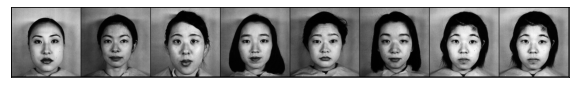

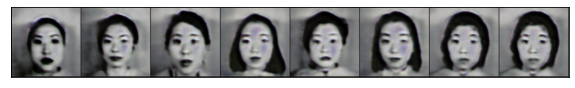

In [22]:
for i, (NE,lc) in enumerate(train_NE):
    if i==1:
        th=NE
        show_images(th)
        show_images(gen_HA(th))
# use the trained generator of Happy expression to generate happy faces from Neural input faces 
#but the model show a poor performance of only the same Neutral faces as the reconstruction

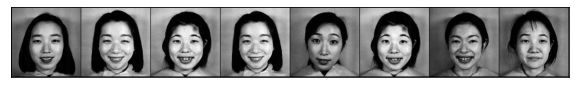

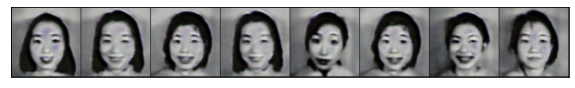

In [24]:
#gencow=torch.load('Generator_Cow.pt')
for i, (HA,lc) in enumerate(train_HA):
    if i==1:
        th=HA
        show_images(th)
        show_images(gen_NE(th))

In [15]:
len(train_All)

82